In [3]:
import os
import re
import sys
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import skimage
import anndata as ad
import seaborn as sns
from matplotlib.pyplot import rc_context

In [4]:
p_dir = (Path().cwd().parents[0]).absolute()
data_dir = p_dir / "data"

In [5]:
%load_ext autoreload
%autoreload 2

module_path = str(p_dir / "src")

if module_path not in sys.path:
    sys.path.append(module_path)


In [6]:
import spatial as sm

In [7]:
donor = f"combined_04_27"

all_donor = [
    "LN Donor A",
    "LN Donor E",
    "INT Donor B",
    "INT Donor E",
    "TS Donor A",
    "TS Donor E",
    "SP Donor A"
]


# Import data

In [8]:
def get_masks_cp(mask_folder):
    """
    Function to get all mask from mask forlder
    """
    # Read masks
    masks = {}

    for (dirpath, dirnames, filenames) in os.walk(mask_folder):
        for name in sorted(filenames):
            if "tif" in name:
                filename = os.path.join(dirpath, name)
                img = skimage.io.imread(filename)
                condition = name.split("_")[2].split("Donor")[0]
                masks[condition] = img[:1000, :1000]
            else:
                continue
    return masks

In [9]:
adata_path = data_dir / "metadata" / f"{donor}.h5ad"
adata = sc.read_h5ad(adata_path)

In [10]:
if "combined" in donor:
    masks = {}
    for d in all_donor:
        masks[d] = get_masks_cp(data_dir / "masks_cp" / d)
else:
    masks = get_masks_cp(data_dir / "masks_cp" / donor)

In [11]:
adata = adata[adata.obs['Dataset'].isin(all_donor)]

In [12]:
adata.obs['X_centroid'] = adata.obsm['spatial'][:,0]
adata.obs['Y_centroid'] = adata.obsm['spatial'][:,1]


C:\Users\thu71\AppData\Local\Temp/ipykernel_1460/3986795138.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['X_centroid'] = adata.obsm['spatial'][:,0]


In [13]:
for d in all_donor:
    adata_subset = adata[adata.obs.Dataset == d, :]
    break

In [14]:
# adata_subset.raw = adata_subset

# Spatial interaction

In [15]:
# adata = sm.tl.spatial_interaction(adata_subset, method='knn', knn=20,pval_method='histocat', phenotype='clusters',
#                                       imageid='Dataset',x_coordinate='X_centroid',y_coordinate='Y_centroid')

In [16]:
# sm.pl.spatial_interaction(adata_subset,  row_cluster=True, col_cluster=True, nonsig_color='white', binary_view=True)

In [17]:
# adata = sm.tl.spatial_distance(adata_subset, x_coordinate='X_centroid', phenotype='clusters',
#                                   y_coordinate='Y_centroid',imageid='Dataset')
# sm.pl.spatial_distance(adata_subset,  phenotype='clusters')

# Spatial LDA

In [18]:
sns.set_style('white')

In [19]:
from sklearn.cluster import MiniBatchKMeans
from kneed import KneeLocator
from matplotlib.ticker import MaxNLocator

In [20]:
adata = sm.tl.spatial_lda(adata, num_motifs=10, radius=30, knn=20, method='radius', imageid='Dataset', phenotype='clusters')

Processing: ['LN Donor A']
Identifying neighbours within 30 pixels of every cell
Processing: ['LN Donor E']
Identifying neighbours within 30 pixels of every cell
Processing: ['INT Donor B']
Identifying neighbours within 30 pixels of every cell
Processing: ['INT Donor E']
Identifying neighbours within 30 pixels of every cell
Processing: ['TS Donor A']
Identifying neighbours within 30 pixels of every cell
Processing: ['TS Donor E']
Identifying neighbours within 30 pixels of every cell
Processing: ['SP Donor A']
Identifying neighbours within 30 pixels of every cell
Pre-Processing Spatial LDA
Training Spatial LDA
Calculating the Coherence Score

Coherence Score:  0.4281982547045641
Gathering the latent weights


In [21]:
adata_CN = ad.AnnData(adata.uns['spatial_lda'].values)
adata_CN.raw = adata.copy()
adata_CN.obs = adata.obs.copy()
adata_CN.uns = adata.uns.copy()
adata_CN.obsm = adata.obsm.copy()
adata_CN.obsp = adata.obsp.copy() 
adata_CN.var_names = adata.uns['spatial_lda'].columns.tolist()

C:\Users\thu71\AppData\Local\Temp/ipykernel_1460/3887406233.py:1: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata_CN = ad.AnnData(adata.uns['spatial_lda'].values)


C:\Users\thu71\Anaconda3\envs\new_codex\lib\site-packages\sklearn\cluster\_kmeans.py:1046: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\thu71\Anaconda3\envs\new_codex\lib\site-packages\sklearn\cluster\_kmeans.py:1046: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\thu71\Anaconda3\envs\new_codex\lib\site-packages\sklearn\cluster\_kmeans.py:1046: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variab

The suggested number of clusters =  11


C:\Users\thu71\AppData\Local\Temp/ipykernel_1460/2749384641.py:30: DeprecationWarning: `np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.str_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  plt.title("The suggested number of clusters = " + np.str(kneedle_point.knee))


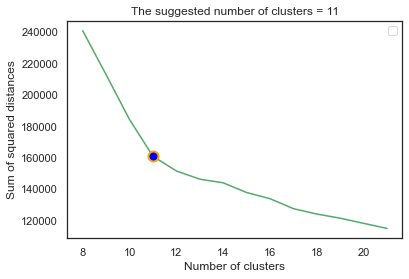

In [22]:
proj_3d = adata_CN.X

n_components = np.arange(8, 22)
models = [
    MiniBatchKMeans(random_state=5, n_clusters=n).fit(proj_3d) for n in n_components
]

BIC_Scores = [m.inertia_ for m in models]
kneedle_point = KneeLocator(
    n_components, BIC_Scores, curve="convex", direction="decreasing"
)
print("The suggested number of clusters = ", kneedle_point.knee)
Elbow_idx = np.where(BIC_Scores == kneedle_point.knee_y)[0]

plt.plot(
    n_components,
    BIC_Scores,
    "-g",
    marker="o",
    markerfacecolor="blue",
    markeredgecolor="orange",
    markeredgewidth="2",
    markersize=10,
    markevery=Elbow_idx,
)
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.legend(loc="best")
plt.xlabel("Number of clusters")
plt.ylabel("Sum of squared distances")
plt.title("The suggested number of clusters = " + np.str(kneedle_point.knee))
plt.show()

In [23]:
n_neighborhoods = 13

km = MiniBatchKMeans(n_clusters=n_neighborhoods, random_state=0)

labels = km.fit_predict(adata.X)
k_centroids = km.cluster_centers_

C:\Users\thu71\Anaconda3\envs\new_codex\lib\site-packages\sklearn\cluster\_kmeans.py:1046: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


In [24]:
df_test = pd.DataFrame()
df_test["Dataset"] = adata_CN.obs["Dataset"].tolist()
df_test["Clusters"] = labels

clusters = df_test["Clusters"].unique().tolist()
clusters.sort(key=int)

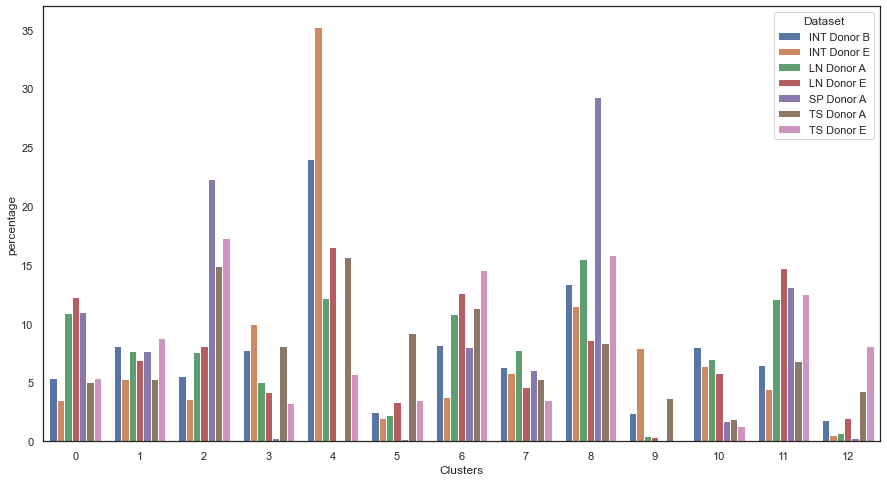

In [25]:
df_test_grouped = (
    df_test.groupby("Dataset")["Clusters"]
    .value_counts(normalize=True)
    .rename("percentage")
    .mul(100)
    .reset_index()
)
with sns.axes_style("white"):
    sns.barplot(
        data=df_test_grouped,
        x="Clusters",
        y="percentage",
        hue="Dataset",
        order=[i for i in clusters],
    )
    plt.gcf().set_size_inches(15, 8)

In [26]:
adata_CN.obs["CN"] = labels
adata_CN.obs["CN"] = adata_CN.obs["CN"].astype("category")
# adata_CN.uns["CN_colors"] = adata.uns["clusters_colors"][:len(np.unique(adata_CN.obs['CN']))]
adata_CN.uns["CN_colors"] = sc.pl.palettes.vega_20[:len(np.unique(adata_CN.obs['CN']))]

adata_CN.obs["CN"] = adata_CN.obs["CN"].cat.reorder_categories(clusters)

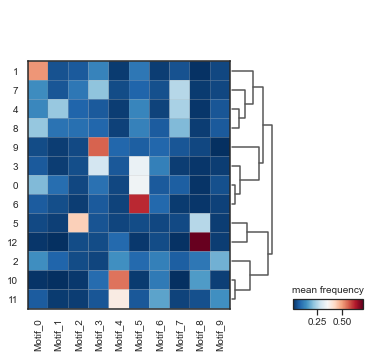

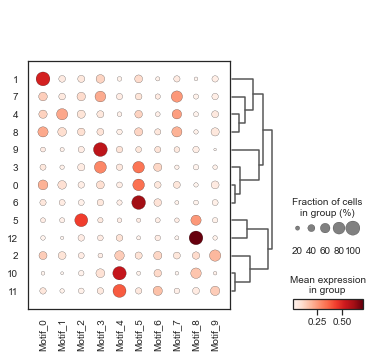

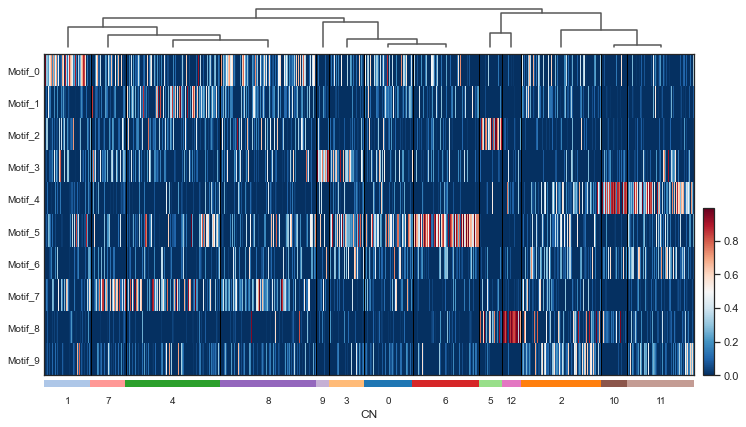

In [27]:
sc.tl.dendrogram(adata_CN, groupby="CN")
sc.pl.matrixplot(
    adata_CN,
    adata_CN.var_names.tolist(),
    "CN",
    dendrogram=True,
    colorbar_title="mean frequency",
    cmap="RdBu_r",
    use_raw=False,
)

sc.pl.dotplot(
    adata_CN, adata_CN.var_names.tolist(), "CN", dendrogram=True, use_raw=False
)

sc.pl.heatmap(
    adata_CN,
    adata_CN.var_names.tolist(),
    "CN",
    dendrogram=True,
    swap_axes=True,
    cmap="RdBu_r",
    figsize=(12, 7),
    use_raw=False,
)

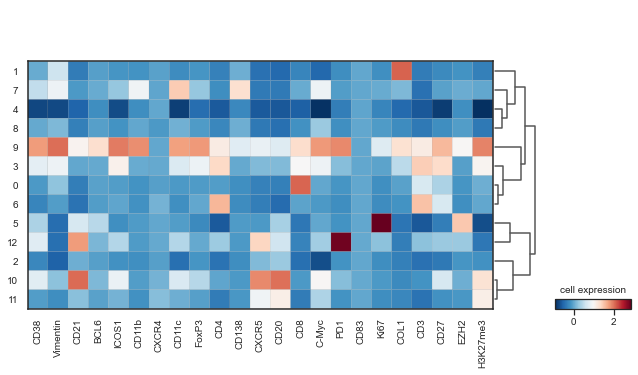

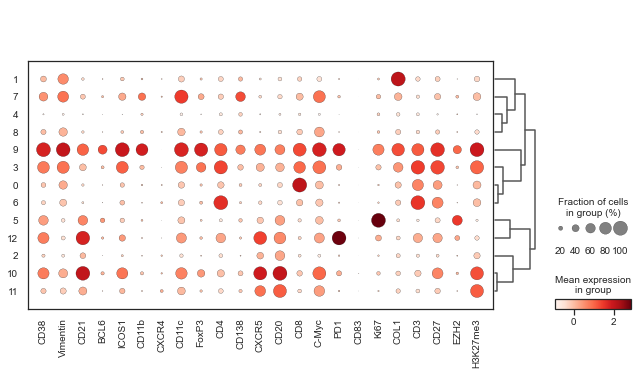

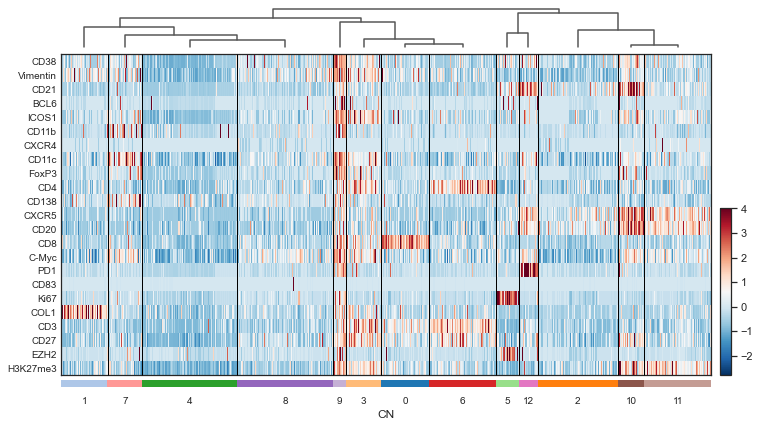

In [28]:
sc.pl.matrixplot(
    adata_CN,
    adata_CN.raw.var_names.tolist(),
    "CN",
    dendrogram=True,
    colorbar_title="cell expression",
    cmap="RdBu_r",
    use_raw=True,
)

sc.pl.dotplot(
    adata_CN, adata_CN.raw.var_names.tolist(), "CN", dendrogram=True, use_raw=True
)

sc.pl.heatmap(
    adata_CN,
    adata_CN.raw.var_names.tolist(),
    "CN",
    dendrogram=True,
    swap_axes=True,
    cmap="RdBu_r",
    figsize=(12, 7),
    use_raw=True,
)

# CN plot

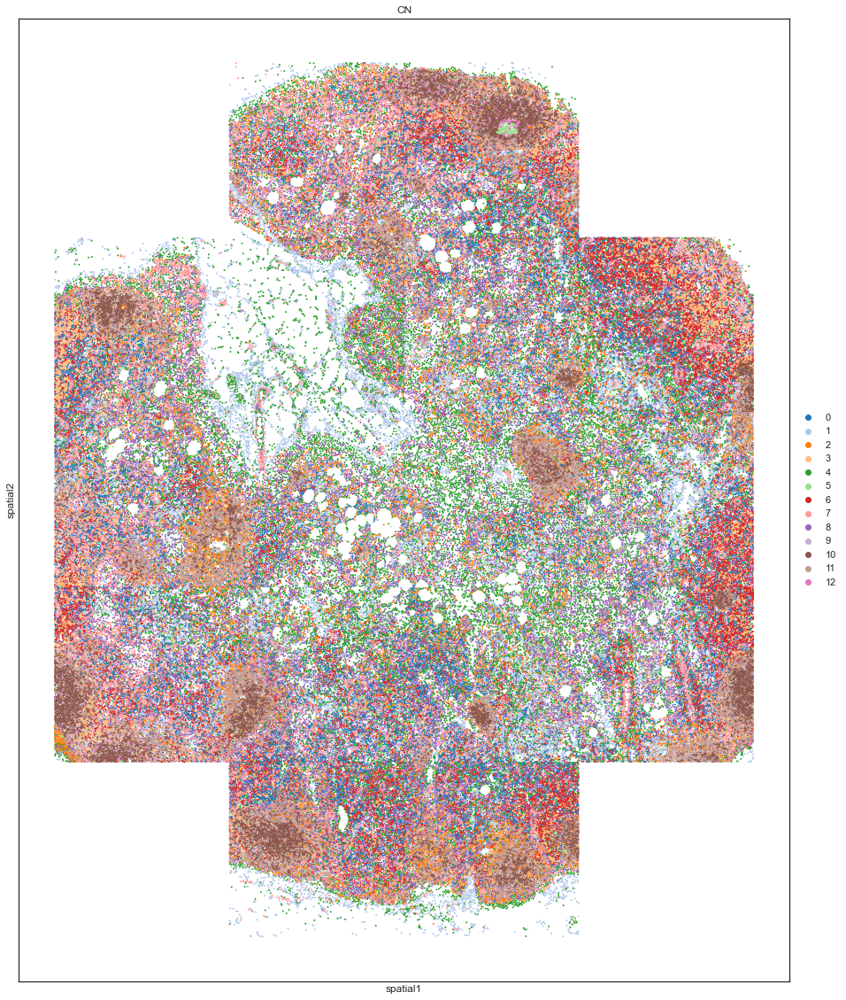

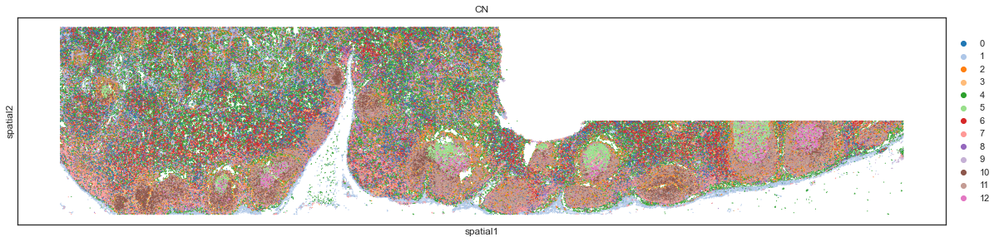

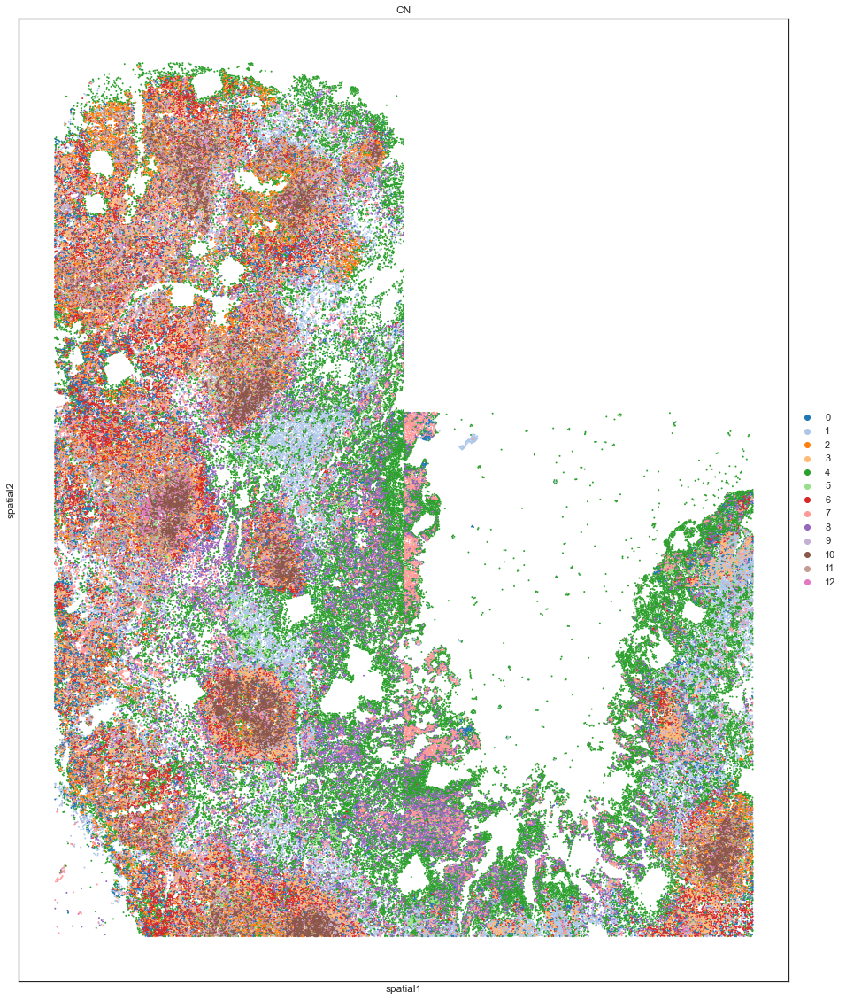

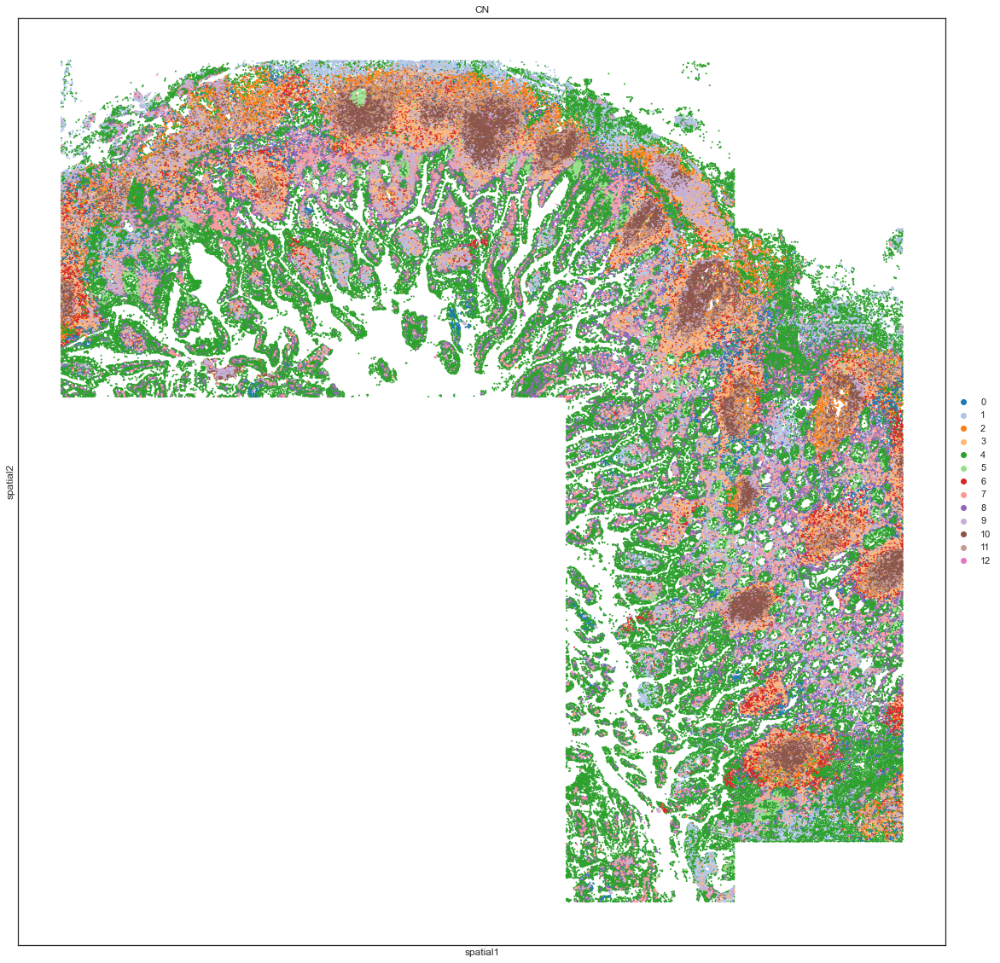

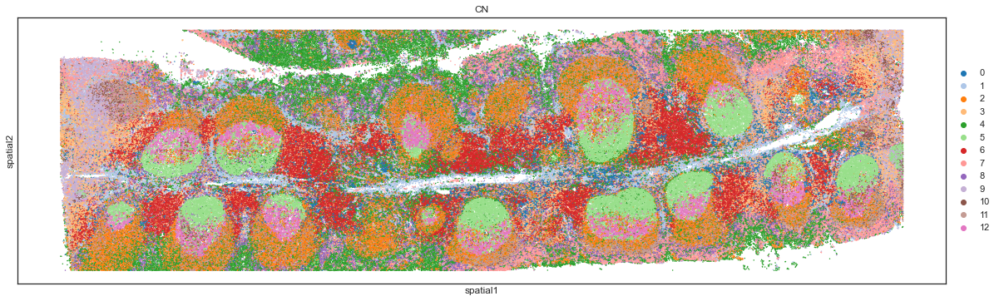

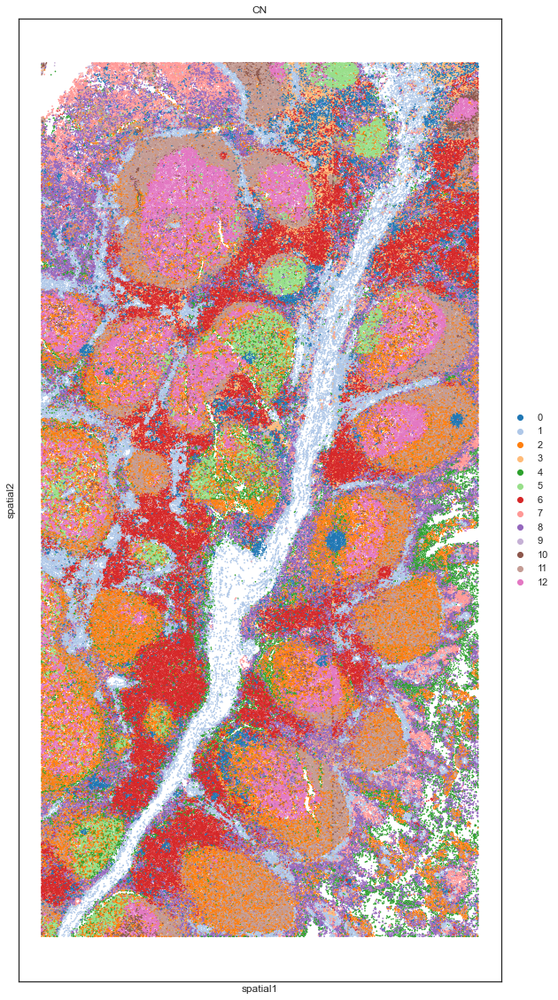

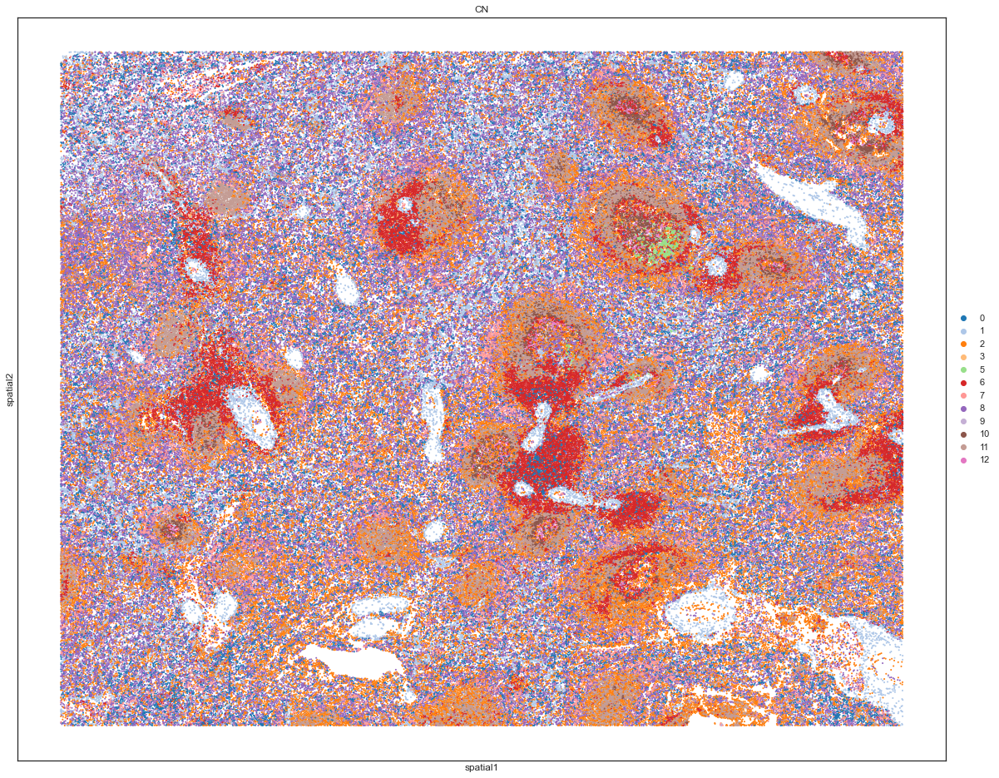

In [29]:
for d in all_donor:
    adata_subset = adata_CN[adata_CN.obs.Dataset == d, :]

    with rc_context({"figure.figsize": (20, 20)}):
        sc.pl.spatial(
            adata_subset, color="CN", spot_size=10,
        )

In [30]:
# for donor in all_donor:
#     with rc_context({'figure.figsize': (7, 7)}):
#         adata_subset = adata_CN[adata_CN.obs.Dataset == donor, :]
#         sc.pl.tsne(adata_subset, color=['CN'], size=5, 
#                    legend_fontsize=12, legend_fontoutline=2,
#                    title=f'{donor}',
#                    frameon=False)

In [31]:
df_cluster = sc.get.obs_df(adata_CN, keys=['Dataset', 'CN'])
df_cluster_count = df_cluster.value_counts().to_frame('counts').reset_index()
df_cluster_count['Density'] = df_cluster_count.groupby('Dataset')["counts"].apply(lambda x: x / x.sum())
df_cluster_count['Dataset'] = pd.Categorical(df_cluster_count['Dataset'])

In [32]:
df_cluster_count.groupby('CN')['counts'].sum()

CN
0     146932
1     139136
2     241101
3     103229
4     284494
5      68158
6     200217
7     105200
8     288763
9      40464
10     79200
11    200676
12     57880
Name: counts, dtype: int64

In [33]:
df_cluster = sc.get.obs_df(adata_CN, keys=['Dataset', 'CN'])
df_cluster_count = df_cluster.value_counts().to_frame('counts').reset_index()
df_cluster_count['Density'] = df_cluster_count.groupby('Dataset')["counts"].apply(lambda x: x / x.sum())
df_cluster_count['Dataset'] = pd.Categorical(df_cluster_count['Dataset'])

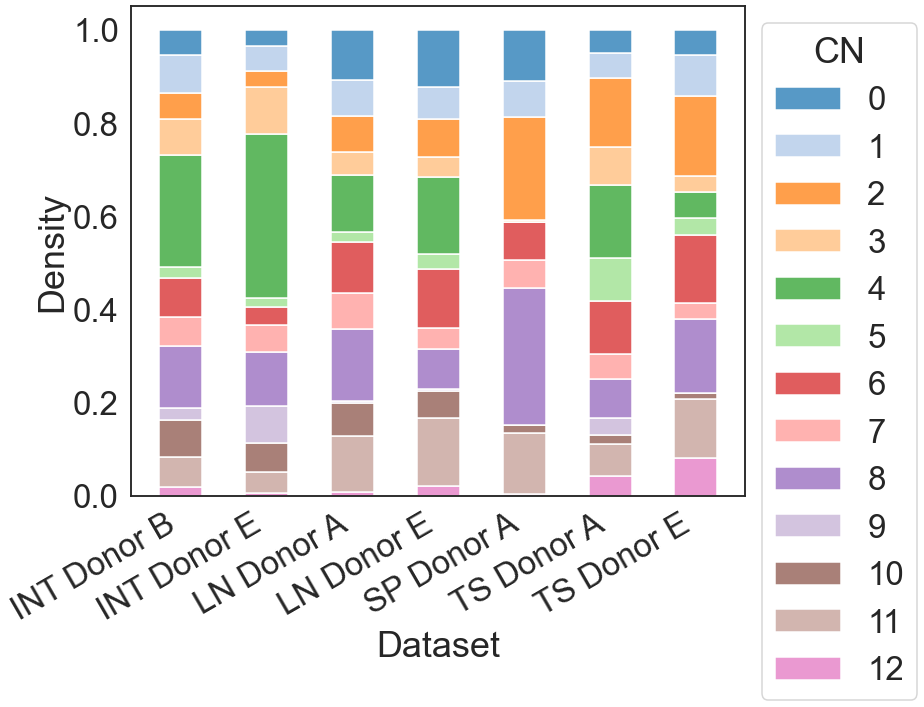

In [34]:
with sns.plotting_context('talk', font_scale=2):
    fig, ax = plt.subplots(figsize=(11, 9))
    ax = sns.histplot(data=df_cluster_count, x='Dataset' , hue='CN', weights='Density',
                 multiple='stack', shrink=0.5, palette=adata_CN.uns['CN_colors'])
    # ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.set_ylabel('Density')

    # Fix the legend so it's not on top of the bars.
    legend = ax.get_legend()
    legend.set_bbox_to_anchor((1, 1))
    plt.xticks(rotation=30, horizontalalignment="right")


In [35]:
df_count = pd.pivot_table(df_cluster_count, values='Density', index='Dataset', columns='CN')

adata_count = ad.AnnData(df_count.values)
adata_count.var_names = df_count.columns.astype(str).tolist()
adata_count.obs['Dataset'] = df_count.index.tolist()
adata_count.obs['Dataset'] = adata_count.obs['Dataset'].astype('category')


C:\Users\thu71\AppData\Local\Temp/ipykernel_1460/1291762946.py:3: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata_count = ad.AnnData(df_count.values)


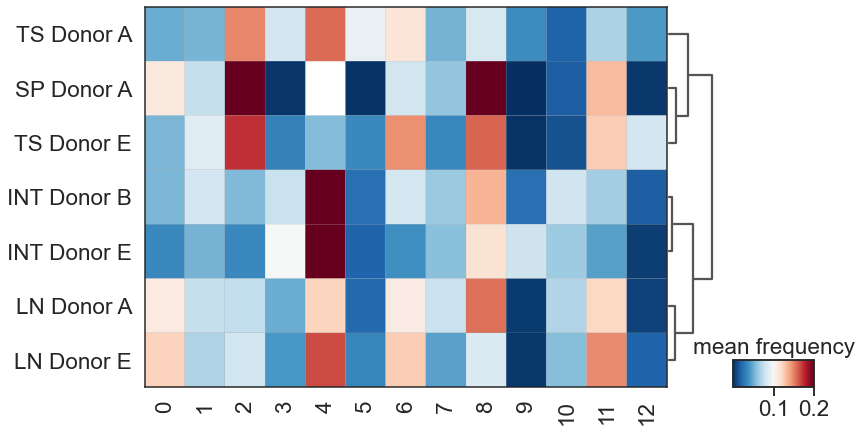

In [36]:

with sns.plotting_context('talk', font_scale=1.5):
    sc.pl.matrixplot(
        adata_count,
        adata_count.var_names.tolist(),
        "Dataset",
        dendrogram=True,
        colorbar_title="mean frequency",
        cmap="RdBu_r",
        vmax=0.2,
        figsize=(12, 7),
    )

In [37]:
del adata_CN.uns['spatial_lda_model']

In [38]:
adata_CN

AnnData object with n_obs × n_vars = 1955450 × 10
    obs: 'ROI', 'Cell', 'Dataset', 'leiden', 'clusters', 'X_centroid', 'Y_centroid', 'CN'
    uns: 'Dataset_colors', 'clusters_colors', 'dendrogram_clusters', 'dendrogram_leiden', 'leiden', 'leiden_colors', 'neighbors', 'spatial_lda', 'spatial_lda_probability', 'CN_colors', 'dendrogram_CN'
    obsm: 'X_scanorama', 'X_tsne', 'X_umap', 'spatial'
    obsp: 'connectivities', 'distances'

In [40]:
# adata_path = data_dir / "metadata" / f"combined_LDA_05_24.h5ad"
# adata_CN.write(adata_path)